In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, SymLogNorm, DivergingNorm
import matplotlib.colors as colors
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd
from scipy.optimize import curve_fit
from scipy.interpolate import interp2d, interp1d
from os import path
import colorcet as cc   # install quickly with "conda install colorcet"
from scipy.interpolate import RectBivariateSpline
from matplotlib import ticker
from scipy.ndimage import gaussian_filter
import matplotlib as mpl
from lmfit import Model

In [2]:
from numpy.linalg import inv

In [3]:
import scipy.io

In [4]:
from matplotlib import cm

In [5]:
from scipy.signal import find_peaks

In [6]:
import glob

In [7]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'svg'

In [8]:
# %matplotlib notebook

In [9]:
font = {
                'family': 'Arial',
                'size': 12,
                'serif': 'Times',
                'sans-serif': 'Arial'
            }

plt.rc('font', **font)

In [10]:
cd ..

/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data


In [11]:
qc.DataSet.default_io.base_location = path.abspath('.')
figfile = path.abspath('.') + '/Figures/FerromagnetismPomeranchukPaper/'

set the full filling and angles of the S13:
-S13 1.09 degrees: slope (B/V) 11.55, capacitance (4.477e-4 C/V*m^2), full-filling gate range (nu=4 - nu=0) 10, V0 somewhere around 0.5, Rxx mainly 02-25, Rxy 25-28



# device S13, 1.09$^\circ$ fan diagram

## Rxx Fan 02-25

In [12]:
d_S13_Fan_1 = qc.load_data('data/2020-12-02/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_10-00-27')
d_S13_Fan_2 = qc.load_data('data/2020-12-05/#002_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_21-12-35')
d_S13_Fan_3 = qc.load_data('data/2020-12-07/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_02-19-23')

In [13]:
Bfield = np.concatenate((d_S13_Fan_1.triton_field_set_stable_set[:45], d_S13_Fan_2.triton_field_set_stable_set[1:59], d_S13_Fan_3.triton_field_set_stable_set[1:]))
gate = d_S13_Fan_1.srframe_volt_p1_set[0, :]
Rxx0225 = abs(np.vstack((d_S13_Fan_1.lockin830_X[:45,:]/1e-9, d_S13_Fan_2.lockin830_X[1:59,:]/1e-9, d_S13_Fan_3.lockin830_X[1:,:]/1e-9)))

In [14]:
Vgatefull0225 = 10
V00225 = 0.5

In [15]:
nugate0225 = np.interp(gate, [V00225 - Vgatefull0225*5/4, V00225 + Vgatefull0225*5/4], [-5, 5])

In [16]:
Rxx0225Bfunc = RectBivariateSpline(nugate0225, Bfield, Rxx0225.T, kx=1, ky=1)

([<matplotlib.axis.XTick at 0x7ff8f2fbbdd0>,
 <a list of 9 Text xticklabel objects>)

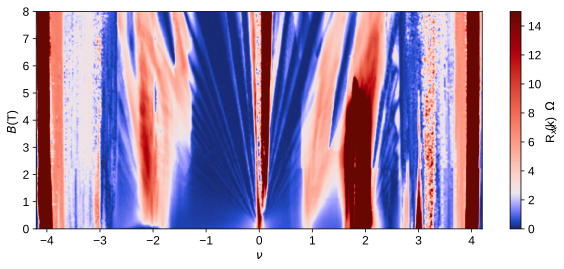

In [17]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxx0225Bint = Rxx0225Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx0225Bint, (1.2, 1.2))/1000, norm=DivergingNorm(2.5, vmin=0, vmax=15), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

## Rxy Fan 25-28

In [18]:
d_S13_Fan_1 = qc.load_data('data/2020-12-11/#014_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_base_1nA_Landaufan_22-29-22')
d_S13_Fan_2 = qc.load_data('data/2020-12-12/#001_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_base_1nA_Landaufan_18-16-00')

In [19]:
Bfield = np.concatenate((d_S13_Fan_1.triton_field_set_stable_set, d_S13_Fan_2.triton_field_set_stable_set))
gate = d_S13_Fan_1.srframe_volt_p1_set[0, :]
Rxy2528 = np.vstack((npd.Rxxfromdata(d_S13_Fan_1, 1e-9, 'lockin830'), npd.Rxxfromdata(d_S13_Fan_2, 1e-9, 'lockin830')))

In [20]:
Vgatefull2528 = 10
V02528 = 0.5

In [21]:
nugate2528 = np.interp(gate, [V02528 - Vgatefull2528*5/4, V02528 + Vgatefull2528*5/4], [-5, 5])

In [22]:
Rxy2528Bfunc = RectBivariateSpline(nugate2528, Bfield, Rxy2528.T, kx=1, ky=1)

([<matplotlib.axis.XTick at 0x7ff8f2fd5790>,
 <a list of 9 Text xticklabel objects>)

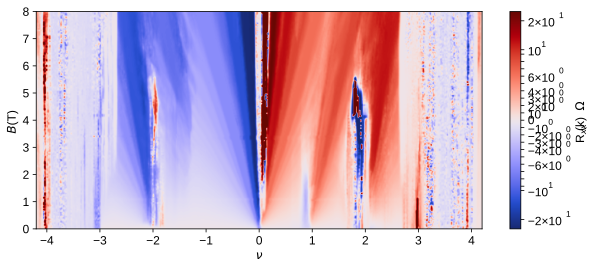

In [23]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxy2528Bint = Rxy2528Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxy2528Bint, (1, 1))/1000, norm=colors.SymLogNorm(9,  vmin=-25, vmax=25), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

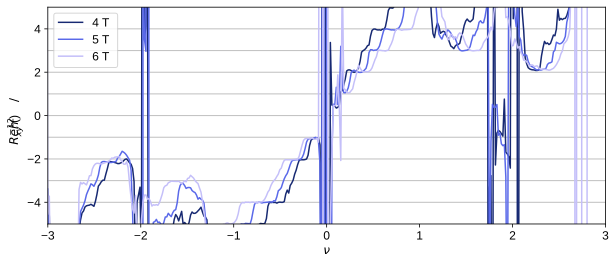

In [24]:
esqh = 1.602e-19**2/6.626e-34
plt.figure(figsize=(10, 4))

N = 6
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(3):
    indx =  80+ i*20
    plt.plot((gate-V02528)/Vgatefull2528*4, 1/gaussian_filter(Rxy2528[indx,:],0.5)/(esqh*1.02),  color = cs[i], label=' {:.0f} T'.format(Bfield[indx]))

plt.hlines(-4, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(-3, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(-2, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(-1, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(0, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(4, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(3, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(2, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(1, -16,16, color='gray', lw=1, alpha=0.5)

plt.xlim(-4,4)
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylim(-5,5)
plt.xlim(-3,3)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xy}^{-1}$ ($e^2/h$)')
plt.legend()

# device S13, 1.09$^\circ$ fan diagram around one quarter

## 3K

In [28]:
d_S13_quarter_fan_3K = qc.load_data('data/2021-01-06/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_3K_B-n_1quarter_14-19-45')

In [29]:
Bfield = d_S13_quarter_fan_3K.triton_field_set_stable_set[:]
gate = d_S13_quarter_fan_3K.srframe_volt_p1_set[0, :]
Rxx0225 = npd.Rxxfromdata(d_S13_quarter_fan_3K, 2e-9, 'lockin865')
Rxy2528 = npd.Rxxfromdata(d_S13_quarter_fan_3K, 2e-9, 'lockin830')

In [30]:
Vgatefull0225 = 10
V00225 = 0.5
Vgatefull2528 = 10
V02528 = 0.5

(-2, 5)

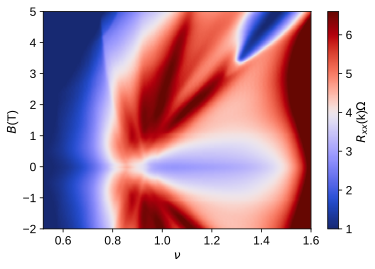

In [31]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, gaussian_filter((Rxx0225[:,:] + Rxx0225[::-1,:])/2, (0.7, 0.7))/1000, norm=DivergingNorm(4, vmin=1, vmax=6.6), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

(-2, 5)

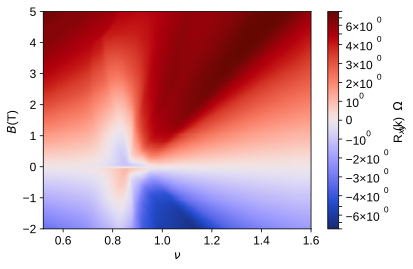

In [32]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V02528)/Vgatefull2528*4, Bfield, gaussian_filter((Rxy2528[:,:] - Rxy2528[::-1,:])/2, (0.7, 0.7))/1000, norm=colors.SymLogNorm(4,  vmin=-8, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

## 5K

In [33]:
d_S13_quarter_fan_5K = qc.load_data('data/2021-01-07/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_5K_B-n_1quarter_19-06-57')
Bfield = d_S13_quarter_fan_5K.triton_field_set_stable_set[:]
gate = d_S13_quarter_fan_5K.srframe_volt_p1_set[0, :]
Rxx0225 = npd.Rxxfromdata(d_S13_quarter_fan_5K, 2e-9, 'lockin865')
Rxy2528 = npd.Rxxfromdata(d_S13_quarter_fan_5K, 2e-9, 'lockin830')

(-2, 5)

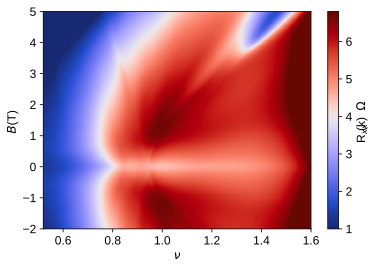

In [34]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, gaussian_filter((Rxx0225[:,:] + Rxx0225[::-1,:])/2, (0.7, 0.7))/1000, norm=DivergingNorm(4, vmin=1, vmax=6.8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

(-2, 5)

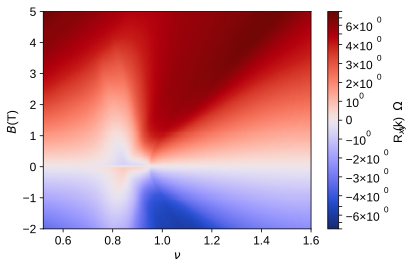

In [35]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V02528)/Vgatefull2528*4, Bfield, gaussian_filter((Rxy2528[:,:] - Rxy2528[::-1,:])/2, (0.7, 0.7))/1000, norm=colors.SymLogNorm(4,  vmin=-8, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

## 7.5K

In [36]:
d_S13_quarter_fan_7p5K = qc.load_data('data/2021-01-08/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_7p5K_B-n_1quarter_23-45-16')
Bfield = d_S13_quarter_fan_7p5K.triton_field_set_stable_set[:]
gate = d_S13_quarter_fan_7p5K.srframe_volt_p1_set[0, :]
Rxx0225 = npd.Rxxfromdata(d_S13_quarter_fan_7p5K, 2e-9, 'lockin865')
Rxy2528 = npd.Rxxfromdata(d_S13_quarter_fan_7p5K, 2e-9, 'lockin830')

(-2, 5)

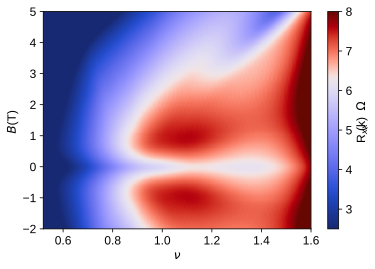

In [37]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, gaussian_filter((Rxx0225[:,:] + Rxx0225[::-1,:])/2, (0.7, 0.7))/1000, norm=DivergingNorm(6.3, vmin=2.5, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

(-2, 5)

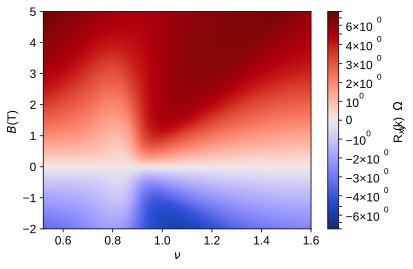

In [38]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V02528)/Vgatefull2528*4, Bfield, gaussian_filter((Rxy2528[:,:] - Rxy2528[::-1,:])/2, (0.7, 0.7))/1000, norm=colors.SymLogNorm(4,  vmin=-8, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

# ferromagnetism filling dependency at different T (best one 1.5K)

## 1.5K

In [112]:
files2528_1quarter_1p5K_1 = sorted(glob.glob('data/2020-12-23/#*/'))[74:124]
files2528_1quarter_1p5K_2 = sorted(glob.glob('data/2020-12-20/#*/'))[108:]
files2528_1quarter_1p5K_3 = sorted(glob.glob('data/2020-12-21/#*/'))[:69]
files2528_1quarter_1p5K = files2528_1quarter_1p5K_1 + files2528_1quarter_1p5K_2 + files2528_1quarter_1p5K_3

In [113]:
nB = 501
nfiles2528_1quarter_1p5K = len(files2528_1quarter_1p5K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files2528_1quarter_1p5K), nB))

for i, f in enumerate(files2528_1quarter_1p5K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [114]:
totalarray830_up = np.zeros((int(len(files2528_1quarter_1p5K)/2), nB))
totalarray830_down = np.zeros((int(len(files2528_1quarter_1p5K)/2), nB))

In [115]:
for i in range(int(len(files2528_1quarter_1p5K)/2)):
    totalarray830_up[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files2528_1quarter_1p5K)/2)):
    totalarray830_down[i,:] = totalarray830[2*i+1, :] 

In [116]:
totalarray830_delta = totalarray830_up - totalarray830_down

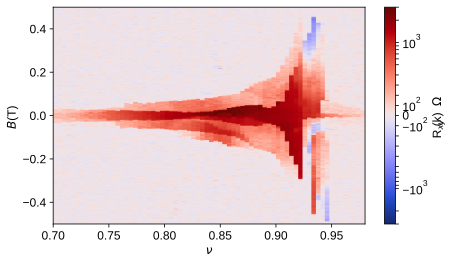

In [117]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.25, 2.95, 71)-V0)/Vfull*4
plt.figure(figsize=(7,4))
plt.pcolormesh(filling,bpts,gaussian_filter(totalarray830_delta.transpose()/1e-9,0),cmap=cc.cm.diverging_bwr_20_95_c54,norm = colors.SymLogNorm(500, vmin= -3e3, vmax=3e3), rasterized=True)
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')

## 3.5K

In [86]:
files2528_1quarter_3p5K_1 = sorted(glob.glob('data/2020-12-21/#*/'))[222:]
files2528_1quarter_3p5K_2 = sorted(glob.glob('data/2020-12-22/#*/'))[:27]
files2528_1quarter_3p5K_3 = sorted(glob.glob('data/2020-12-18/#*/'))[174:]
files2528_1quarter_3p5K_4 = sorted(glob.glob('data/2020-12-19/#*/'))[:58]
files2528_1quarter_3p5K = files2528_1quarter_3p5K_1 + files2528_1quarter_3p5K_2 + files2528_1quarter_3p5K_3 + files2528_1quarter_3p5K_4

In [87]:
nB = 501
nfiles2528_1quarter_3p5K = len(files2528_1quarter_3p5K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files2528_1quarter_3p5K), nB))

for i, f in enumerate(files2528_1quarter_3p5K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [88]:
totalarray830_up = np.zeros((int(len(files2528_1quarter_3p5K)/2), nB))
totalarray830_down = np.zeros((int(len(files2528_1quarter_3p5K)/2), nB))

In [89]:
for i in range(int(len(files2528_1quarter_3p5K)/2)):
    totalarray830_up[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files2528_1quarter_3p5K)/2)):
    totalarray830_down[i,:] = totalarray830[2*i+1, :] 

In [90]:
totalarray830_delta = totalarray830_up - totalarray830_down

(0.7, 0.9800000000000001)

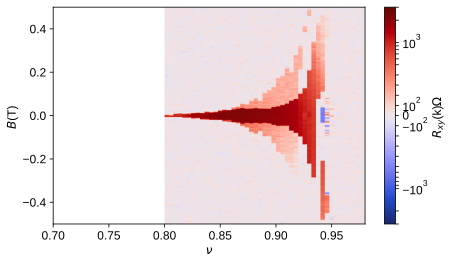

In [91]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.5, 2.95, 46)-V0)/Vfull*4
plt.figure(figsize=(7,4))
plt.pcolormesh(filling,bpts,gaussian_filter(totalarray830_delta.transpose()/1e-9,0),cmap=cc.cm.diverging_bwr_20_95_c54,norm = colors.SymLogNorm(500, vmin= -3e3, vmax=3e3), rasterized=True)
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.colorbar(label='$R_{xy}$ (k$\Omega$)')
plt.xlim((2.25-V0)/Vfull*4, (2.95-V0)/Vfull*4)

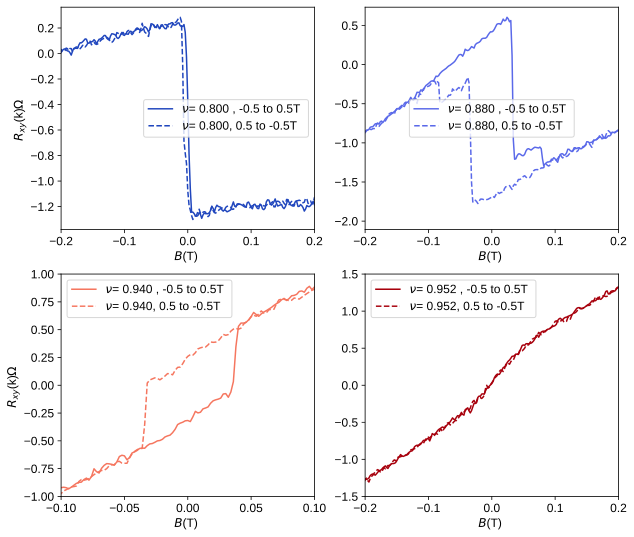

In [92]:
N = 11 # some plots showing sign change
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))


fig, axs = plt.subplots(2, 2, figsize=(10, 9))

i=0
axs[0, 0].plot(bpts, totalarray830_up[i,:]/1e-9/1000, color = cs[1], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[0, 0].plot(bpts, totalarray830_down[i,:]/1e-9/1000, '--', color = cs[1], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[0, 0].set_xlim(-0.2, 0.2)
axs[0, 0].set_xlabel('$B$ (T)')
axs[0, 0].set_ylabel('$R_{xy}$ (k$\Omega$)')
axs[0, 0].legend()


i=20
axs[0, 1].plot(bpts, totalarray830_up[i,:]/1e-9/1000, color = cs[2], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[0, 1].plot(bpts, totalarray830_down[i,:]/1e-9/1000, '--', color = cs[2], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[0, 1].set_xlim(-0.2, 0.2)
axs[0, 1].set_xlabel('$B$ (T)')
axs[0, 1].legend()

i=35
axs[1, 0].plot(bpts, totalarray830_up[i,:]/1e-9/1000, color = cs[7], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[1, 0].plot(bpts, totalarray830_down[i,:]/1e-9/1000, '--', color = cs[7], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[1, 0].set_xlim(-0.1, 0.1)
axs[1, 0].set_ylim(-1, 1)
axs[1, 0].set_xlabel('$B$ (T)')
axs[1, 0].set_ylabel('$R_{xy}$ (k$\Omega$)')
axs[1, 0].legend()

i=38
axs[1, 1].plot(bpts, totalarray830_up[i,:]/1e-9/1000, color = cs[9], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[1, 1].plot(bpts, totalarray830_down[i,:]/1e-9/1000, '--', color = cs[9], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[1, 1].set_xlim(-0.2, 0.2)
axs[1, 1].set_ylim(-1.5, 1.5)
axs[1, 1].set_xlabel('$B$ (T)')
axs[1, 1].legend()

## 4K

In [93]:
files2528_1quarter_4K = sorted(glob.glob('data/2020-12-20/#*/'))[:82]

In [94]:
nB = 501
nfiles2528_1quarter_4K = len(files2528_1quarter_4K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files2528_1quarter_4K), nB))

for i, f in enumerate(files2528_1quarter_4K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [95]:
totalarray830_up = np.zeros((int(len(files2528_1quarter_4K)/2), nB))
totalarray830_down = np.zeros((int(len(files2528_1quarter_4K)/2), nB))

In [96]:
for i in range(int(len(files2528_1quarter_4K)/2)):
    totalarray830_up[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files2528_1quarter_4K)/2)):
    totalarray830_down[i,:] = totalarray830[2*i+1, :] 

In [97]:
totalarray830_delta = totalarray830_up - totalarray830_down

(0.7, 0.9800000000000001)

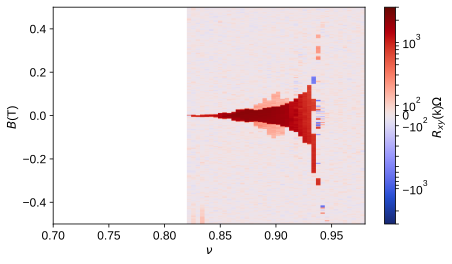

In [98]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.55, 2.95, 41)-V0)/Vfull*4
plt.figure(figsize=(7,4))
plt.pcolormesh(filling,bpts,gaussian_filter(totalarray830_delta.transpose()/1e-9,0),cmap=cc.cm.diverging_bwr_20_95_c54,norm = colors.SymLogNorm(500, vmin= -3e3, vmax=3e3), rasterized=True)
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.colorbar(label='$R_{xy}$ (k$\Omega$)')
plt.xlim((2.25-V0)/Vfull*4, (2.95-V0)/Vfull*4)

# OM gate switch

## 4K at nu = (2.76-0.5)/10*4 = 0.904 sweeping B field

In [99]:
dBsweep_up_nu0p904 = qc.load_data('data/2020-12-17/#007_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K_14-06-11')
dBsweep_down_nu0p904 = qc.load_data('data/2020-12-17/#008_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K_14-16-32')

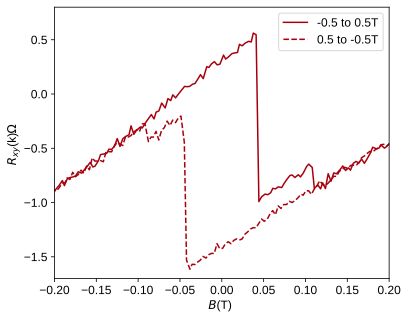

In [100]:
plt.figure(figsize=(6,5))
plt.plot(dBsweep_up_nu0p904.triton_field, dBsweep_up_nu0p904.lockin830_X[:]/1e-9/1000, color = cs[9], label='-0.5 to 0.5T'.format(filling[i]))
plt.plot(dBsweep_down_nu0p904.triton_field, dBsweep_down_nu0p904.lockin830_X[:]/1e-9/1000, '--', color = cs[9], label='0.5 to -0.5T'.format(filling[i]))
#plt.set_xlim(-0.2, 0.2)
#plt.set_ylim(-1.5, 1.5)
plt.xlabel('$B$ (T)')
plt.ylabel('$R_{xy}$ (k$\Omega$)')
plt.xlim(-0.2,0.2)
plt.ylim(-1.7,0.8)
plt.legend()

## 4K at B = 30mT sweeping filling

In [101]:
dnusweep_up_nu0p904 = qc.load_data('data/2020-12-17/#012_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-51-14')
dnusweep_down_nu0p904 = qc.load_data('data/2020-12-17/#013_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-54-15')

In [102]:
Vfull = 10
V0 = 0.5

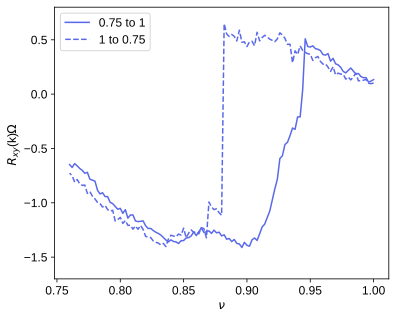

In [103]:
plt.figure(figsize=(6,5))
plt.plot((dnusweep_up_nu0p904.srframe_volt_p1_set[:] - V0)/Vfull*4, dnusweep_up_nu0p904.lockin830_X[:]/1e-9/1000, color = cs[2], label='0.75 to 1'.format(filling[i]))
plt.plot((dnusweep_down_nu0p904.srframe_volt_p1_set[:] - V0)/Vfull*4, dnusweep_down_nu0p904.lockin830_X[:]/1e-9/1000, '--', color = cs[2], label='1 to 0.75'.format(filling[i]))
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xy}$ (k$\Omega$)')
#plt.xlim(-0.2,0.2)
plt.ylim(-1.7,0.8)
plt.legend()

## 3D

In [104]:
fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection='3d')


plt.plot((dnusweep_up_nu0p904.srframe_volt_p1_set[20:] - V0)/Vfull*4, gaussian_filter(dnusweep_up_nu0p904.lockin830_X[20:]/1e-9/1000,0.7), color = cs[2],zs=0.03, zdir='y')
plt.plot((dnusweep_down_nu0p904.srframe_volt_p1_set[:100] - V0)/Vfull*4, gaussian_filter(dnusweep_down_nu0p904.lockin830_X[:100]/1e-9/1000,0.7), '--',color = cs[2],zs=0.03, zdir='y')
        
plt.plot(dBsweep_up_nu0p904.triton_field[90:214], gaussian_filter(dBsweep_up_nu0p904.lockin830_X[90:214]/1e-9/1000,0.7), color = cs[9], zs=0.904, zdir='x')
plt.plot(dBsweep_down_nu0p904.triton_field[90:214], gaussian_filter(dBsweep_down_nu0p904.lockin830_X[90:214]/1e-9/1000,0.7), '--', color = cs[9], zs=0.904, zdir='x')

ax.set_xlabel(r'$\nu$')
ax.set_ylabel('$B$ (T)')
ax.set_zlabel('$R_{xy}$ (k$\Omega$)');
ax.set_xticks([0.85, 0.9, 0.95, 1])
ax.set_yticks([-0.2, -0.1, 0, 0.1, 0.2])
ax.set_xlim(0.85,1);
ax.set_ylim(-0.2,0.2);
ax.set_zlim(-1.7,0.8);
ax.xaxis._axinfo["grid"]['color'] =  (0,0,0,0)
ax.yaxis._axinfo["grid"]['color'] =  (0,0,0,0)
ax.zaxis._axinfo["grid"]['color'] =  (0,0,0,0)
ax.view_init(elev=20 ,azim=-40)

ValueError: Unknown projection '3d'

<Figure size 1800x1800 with 0 Axes>

## sweep gate at different field

In [105]:
files2528_1quarter_4K_1 = sorted(glob.glob('data/2020-12-17/#*/'))[49:]
files2528_1quarter_4K_2 = sorted(glob.glob('data/2020-12-18/#*/'))[:150]
files2528_1quarter_4K_sweepgate = files2528_1quarter_4K_1 + files2528_1quarter_4K_2

In [106]:
nVg = 121
nfiles2528_1quarter = len(files2528_1quarter_4K_sweepgate)

totalarray830 = np.zeros((len(files2528_1quarter_4K_sweepgate), nVg))

for i, f in enumerate(files2528_1quarter_4K_sweepgate):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        totalarray830[i, :] = data.lockin830_X[:]
    else:
        data = qc.load_data(f[:-1])
        totalarray830[i, :] = data.lockin830_X[::-1]

In [107]:
totalarray830_forward = np.zeros((int(len(files2528_1quarter_4K_sweepgate)/2), nVg))
totalarray830_backward = np.zeros((int(len(files2528_1quarter_4K_sweepgate)/2), nVg))

In [108]:
for i in range(int(len(files2528_1quarter_4K_sweepgate)/2)):
    totalarray830_forward[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files2528_1quarter_4K_sweepgate)/2)):
    totalarray830_backward[i,:] = totalarray830[2*i+1, :] 

In [109]:
totalarray830_delta = totalarray830_backward - totalarray830_forward

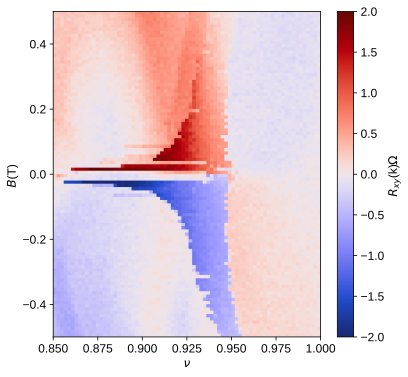

In [111]:
V0 = 0.5
Vfull = 10
Bpts = np.linspace(0.5, -0.5,101)
filling = (np.linspace(2.4, 3,121)-V0)/Vfull*4

plt.figure(figsize=(6,6))
plt.pcolormesh(filling,Bpts,totalarray830_delta/1e-9/1000,cmap=cc.cm.diverging_bwr_20_95_c54,norm = colors.DivergingNorm(0, vmin= -2, vmax=2), rasterized=True)
plt.xlabel(r'$\nu$')
plt.ylabel('$B$ (T)')
plt.xlim(0.85,1)
plt.colorbar(label='$R_{xy}$ (k$\Omega$)')

# device S13, 1.09$^\circ$ Rxx T dependence

## full range

In [25]:
dtempbase = qc.load_data('data/2020-12-03/#004_S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep_11-31-59')
dtemp_1 = qc.load_data('data/2020-12-03/#005_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweepto1K_11-50-09')
dtemp_2 = qc.load_data('data/2020-12-03/#006_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p05to1p4K_17-12-31')
dtemp_3 = qc.load_data('data/2020-12-03/#007_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p45to2K_19-21-48')
dtemp_4 = qc.load_data('data/2020-12-03/#008_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep2p1to10K_22-51-46')
dtemp_5 = qc.load_data('data/2020-12-04/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep10p5to30K_20-18-38')
dtemp_6 = qc.load_data('data/2020-12-05/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep30p5to40K_07-42-45')

In [26]:
temps = np.concatenate(([0.025], dtemp_1.triton_pid_setpoint_set, dtemp_2.triton_pid_setpoint_set[:], dtemp_3.triton_pid_setpoint_set, dtemp_4.triton_pid_setpoint_set[:], dtemp_5.triton_pid_setpoint_set, dtemp_6.triton_pid_setpoint_set[:]))
gate = dtempbase.srframe_volt_p1_set[:]
Rxx0225 = np.vstack((npd.Rxxfromdata(dtempbase, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_5, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_6, 1e-9, 'lockin830')))

In [27]:
Vgatefull0225 = 10
V00225 = 0.5

In [28]:
nugate0225 = np.interp(gate, [V00225 - Vgatefull0225*5/4, V00225 + Vgatefull0225*5/4], [-5, 5])

In [29]:
Rxx0225Tfunc = RectBivariateSpline(nugate0225, temps, Rxx0225.T, kx=1, ky=1)

([<matplotlib.axis.YTick at 0x7ff8e242b8d0>,
 <a list of 4 Text yticklabel objects>)

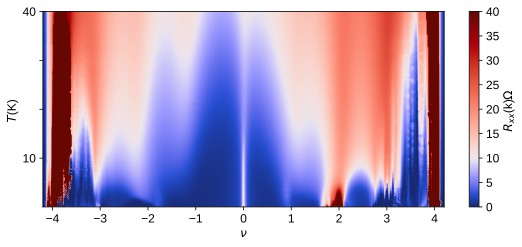

In [30]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0.025, 40, 600)
Rxx0225Tint = Rxx0225Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx0225Tint, (0.5, 0.5))/1000, norm=DivergingNorm(vcenter=10, vmin=0, vmax=40), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 40))
plt.yticks([10, 20, 30, 40], [10, '', '', 40])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

## zoom in  one quarter

<IPython.core.display.Javascript object>


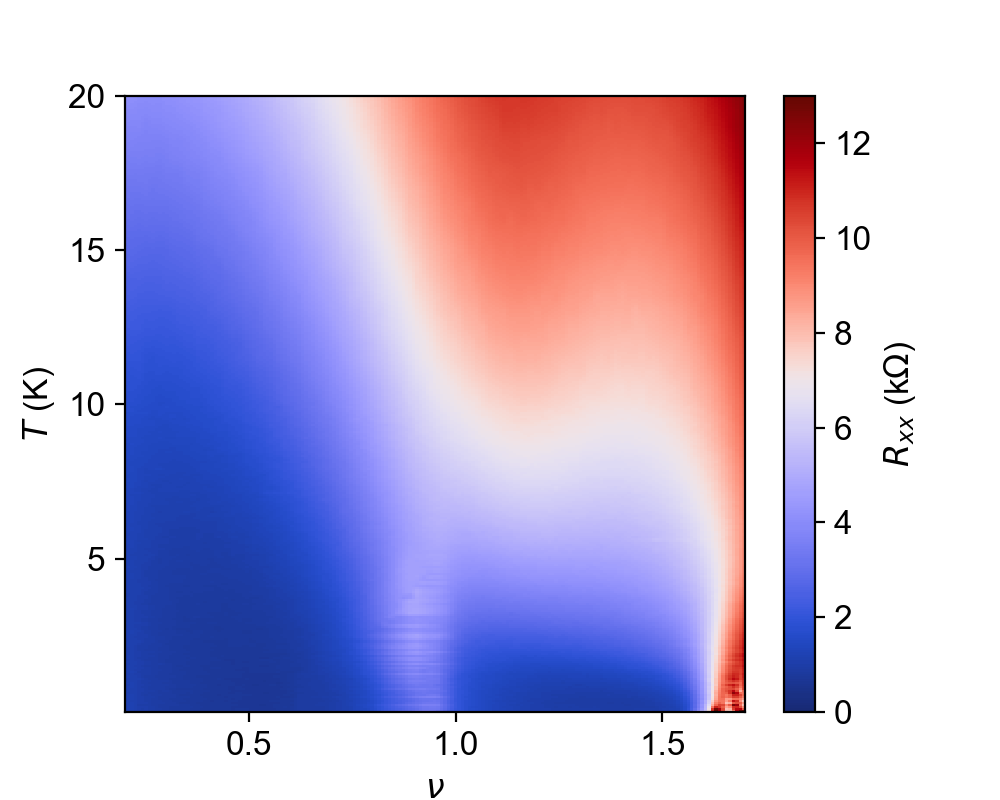

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


(0.025, 20.0)

In [515]:
plt.figure(figsize=(5, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx0225Tint, (0, 0))/1000, norm=DivergingNorm(vcenter=7, vmin=0, vmax=13), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')
plt.xticks([0.5, 1, 1.5])
plt.yticks([5, 10, 15, 20])
plt.xlim(0.2,1.7)
plt.ylim(0.025,20)


<IPython.core.display.Javascript object>


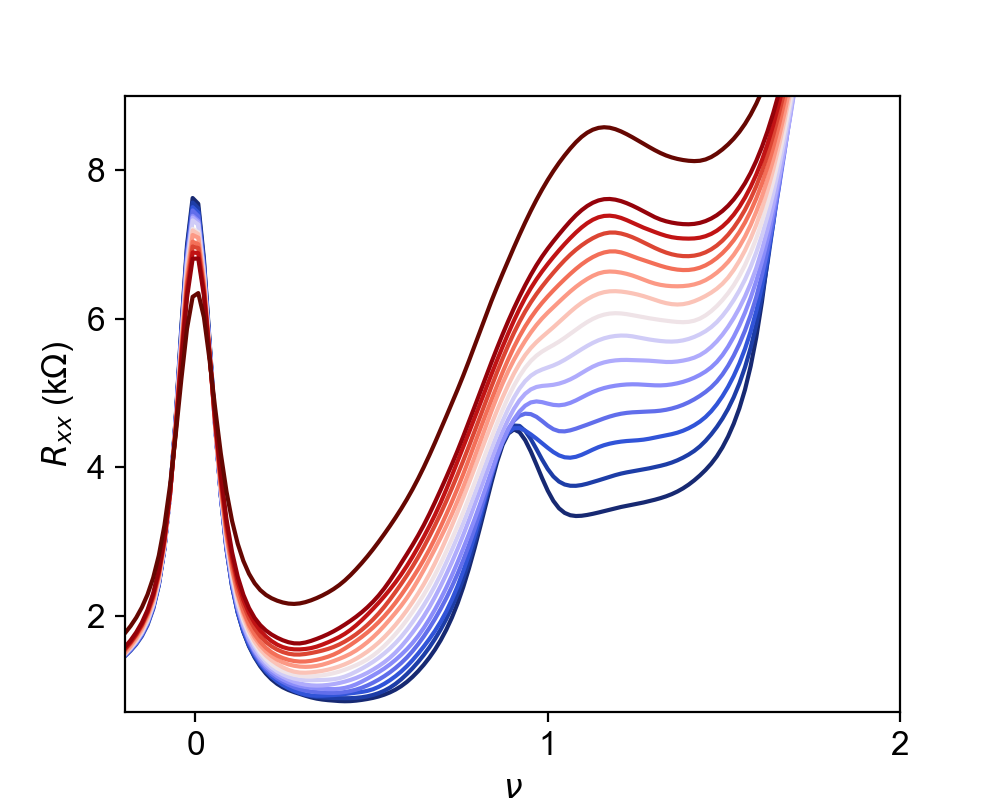

(0.7, 9.0)

In [536]:
plt.figure(figsize=(5, 4))

N = 15
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(11,26):
    indx =  i*5
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, gaussian_filter(Rxx0225[indx,:],2)/1000,  color = cs[i-11], label='T {:.3f} K'.format(temps[indx]))


plt.xlim(-0.2,2)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xx}$ (k$\Omega$)')
plt.yticks([2, 4, 6, 8])
plt.xticks([0, 1, 2])
plt.ylim(0.7,9)
#plt.legend()

# device S13, 1.09$^\circ$ Rxy T dependence

In [31]:
data_n_T_base = qc.load_data('data/2020-12-29/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_21-58-23')
data_n_T_1 = qc.load_data('data/2020-12-29/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy0p5T_22-17-21')
data_n_T_2 = qc.load_data('data/2020-12-30/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T_03-45-27')
data_n_T_3 = qc.load_data('data/2020-12-30/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy0p5T_04-51-41')
data_n_T_4 = qc.load_data('data/2020-12-30/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_09-50-17')
data_n_T_5 = qc.load_data('data/2020-12-30/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy0p5T_20-46-45')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy2528_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_5, 3e-9, 'lockin865')))

In [32]:
data_n_T_base = qc.load_data('data/2020-12-31/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_-0p5T_15-14-12')
data_n_T_1 = qc.load_data('data/2020-12-31/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy-0p5T_15-31-16')
data_n_T_2 = qc.load_data('data/2020-12-31/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T_20-59-14')
data_n_T_3 = qc.load_data('data/2020-12-31/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T_22-05-25')
data_n_T_4 = qc.load_data('data/2021-01-01/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_00-23-35')
data_n_T_5 = qc.load_data('data/2021-01-01/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T_11-32-16')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy2528_m0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_5, 3e-9, 'lockin865')))

In [33]:
plt.figure(figsize=(10, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, gaussian_filter((Rxy2528_0p5T-Rxy2528_m0p5T)/2,0)/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=DivergingNorm(vcenter=0, vmin=-3, vmax=3))


plt.xlabel(r'$\nu$')
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$R_{xy}$ (k$\Omega$)')
plt.axis()
plt.ylim(0.025,25)

(0.025, 25)

# device S13, 1.09$^\circ$ SC Fraunhofer pattern nu = -2.32

In [616]:
d_S13_holeSC_Fpattern = qc.load_data('data/2020-12-08/#008_S13_865_3-2_830_2-25_8302_4-3_1nA_vg_-5p3_field_Ic_baseT_23-14-16')
Bfield = d_S13_holeSC_Fpattern.triton_field_set_stable_set[:]
I_DC = d_S13_holeSC_Fpattern.srframe_volt_p5_set[0, :]*100
Rxx0225 = npd.Rxxfromdata(d_S13_holeSC_Fpattern, 1e-9, 'lockin830')

In [617]:
# filling
Vfull = 10
V0 = 0.5
nu = (-5.3-V0)/Vfull*4
nu

-2.32

<IPython.core.display.Javascript object>


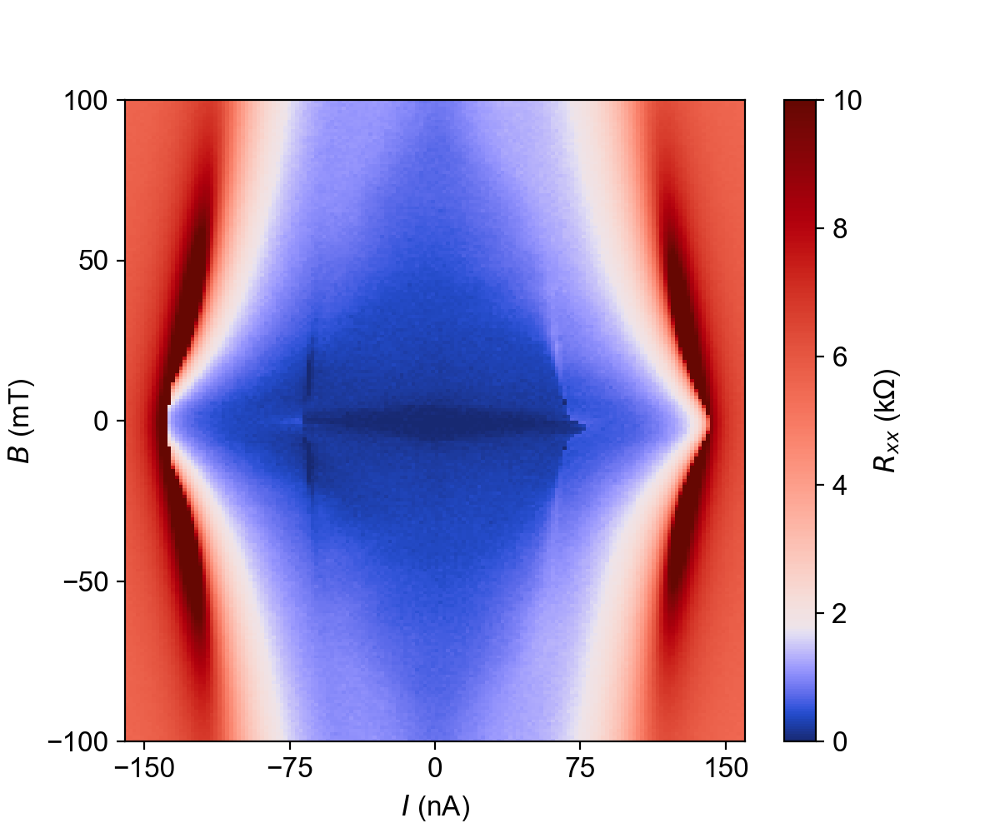

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


Text(0, 0.5, '$B$ (mT)')

In [618]:
plt.figure(figsize=(6, 5))
plt.pcolormesh(I_DC, Bfield*1000, gaussian_filter(Rxx0225[:,:], (0, 0))/1000, norm=DivergingNorm(1.8, vmin=0, vmax=10), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlim(-160,160)
plt.xticks([-150 ,-75, 0, 75, 150])
plt.yticks([-100 ,-50, 0, 50, 100])
plt.xlabel(r'$I$ (nA)')
plt.ylabel(r'$B$ (mT)')